# Preparation

In [1]:
my_packages <- c("data.table", "tidyverse",
                 "ggplot2", "grid", 
                 "patchwork", 
                 "Seurat")
pacman::p_load(char = my_packages)

tmp <- list()

In [13]:
sessionInfo()
# BY mugpeng@foxmail.com, ZZC

R version 4.1.3 (2022-03-10)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Ubuntu 18.04.6 LTS

Matrix products: default
BLAS/LAPACK: /data1/bioteam_usr/yzpeng/miniconda3/envs/R4.1/lib/libopenblasp-r0.3.20.so

locale:
 [1] LC_CTYPE=zh_CN.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=zh_CN.UTF-8        LC_COLLATE=zh_CN.UTF-8    
 [5] LC_MONETARY=zh_CN.UTF-8    LC_MESSAGES=zh_CN.UTF-8   
 [7] LC_PAPER=zh_CN.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=zh_CN.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] grid      stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] sp_1.5-0           SeuratObject_4.1.2 Seurat_4.2.0       patchwork_1.1.2   
 [5] lubridate_1.9.2    forcats_1.0.0      stringr_1.5.0      dplyr_1.1.2       
 [9] purrr_1.0.1        readr_2.1.4        tidyr_1.3.0        tibble_3.2.1      
[13] ggplot2_3.4.2      tidyverse_2.

In [2]:
getwd()

[1] "/data1/bioteam_usr/yzpeng/1-project/1212_XunYin"

In [2]:
spa_p1T <- readRDS(file = "Input/STData of HCC/P1T_Spatial.rds.gz")

In [56]:
spa_p1T

An object of class Seurat 
36635 features across 3348 samples within 4 assays 
Active assay: Spatial (36601 features, 2000 variable features)
 3 other assays present: Fibroblst_predictions, Endo_predictions, Myeloid_predictions
 3 dimensional reductions calculated: pca, tsne, umap
 6 images present: image_P11_N, image_P11_T, image_P12_N, image_P12_T, image_P15_N, image_P15_T

In [3]:
spa_p11T <- readRDS(file = "Input/STData of HCC/P11T_Spatial.rds.gz")
spa_p11T$DefineTypes <- spa_p11T@active.ident
spa_p7T <- readRDS(file = "Input/STData of HCC/P7T_Spatial.rds.gz")
spa_p9T <- readRDS(file = "Input/STData of HCC/P9T_Spatial.rds.gz")
spa_p9T$DefineTypes <- spa_p9T@active.ident

# Note

Some cell annotations are different between provided seurat obj and figure on paper, I have fixed them.

# Fig1B,C,D,E,F,G

## B,C

In [8]:
pal <- c("#4798B3", "#008080", "#DC143C", "#2F4F4F", "#9CED5F", "#FFBF00", "#5000B8")
prismatic::color(pal)

<colors>
#4798B3FF #008080FF #DC143CFF #2F4F4FFF #9CED5FFF #FFBF00FF #5000B8FF 

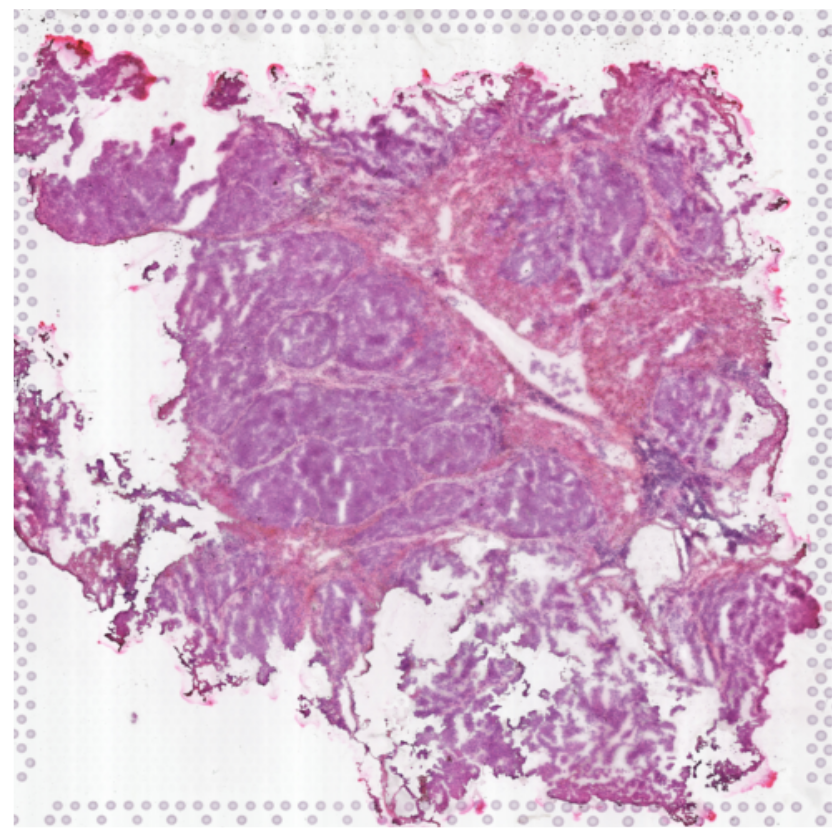

In [6]:
pbc_1 <- SpatialFeaturePlot(spa_p1T, images = "image_P11_T", 
                   features = NULL, alpha = 0) + theme(legend.position = "none")
pbc_1 <- pbc_1[[1]]
pbc_1

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


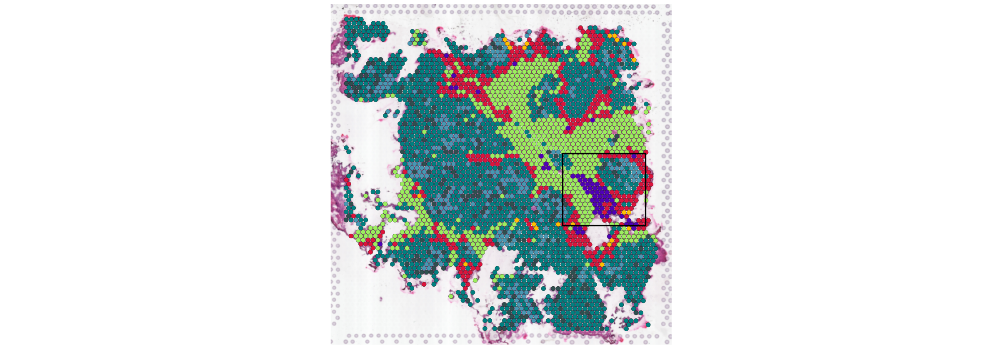

In [24]:
pbc_2 <- SpatialPlot(spa_p1T, images = "image_P11_T", 
                   group.by = "DefineTypes",
            pt.size.factor =1.3) + 
  theme(legend.position = "none") + 
  scale_fill_manual(values = pal) 
pbc_2 <- pbc_2[[1]]
rect1 <- grid::rectGrob(gp = gpar(fill = NA, col = "black", lwd = 2))
pbc_2 <- pbc_2 + annotation_custom(rect1, 
                       xmin=380,xmax=500,ymin=250,ymax=360
                       )
pbc_2

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


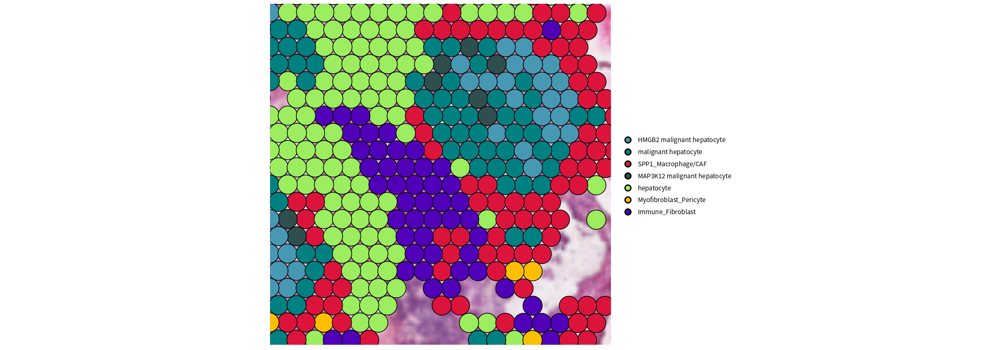

In [15]:
pbc_3 <- SpatialPlot(spa_p1T, images = "image_P11_T", 
                   group.by = "DefineTypes",
            pt.size.factor =6, stroke = 1) + 
  theme(legend.position = "right",
        legend.key = element_blank(),
        legend.title = element_blank()) + 
  scale_fill_manual(values = pal) + 
  guides(fill = guide_legend(override.aes = list(size = 3)))
pbc_3 <- pbc_3[[1]] + coord_cartesian(xlim = c(380,500), ylim = c(250, 360))
pbc_3

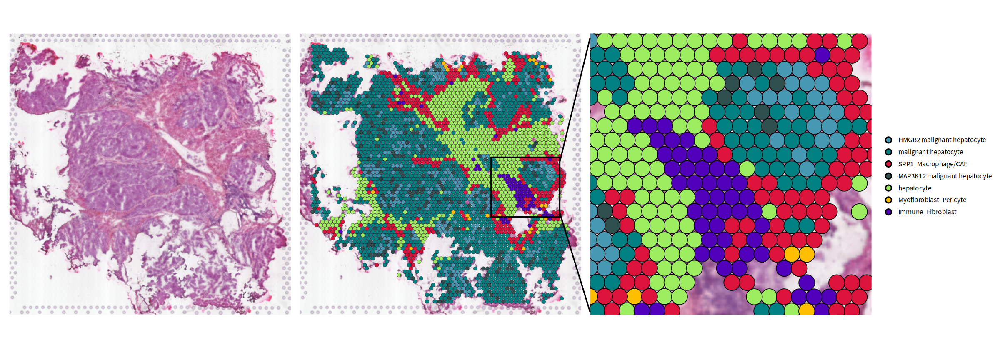

In [43]:
options(repr.plot.width=20)
pbc_1 + pbc_2 + pbc_3
grid.draw(segmentsGrob(x0 = 0.56, x1 = 0.59, y0 = 0.54, y1 = 0.89, gp = gpar(lwd = 2)))
grid.draw(segmentsGrob(x0 = 0.56, x1 = 0.59, y0 = 0.39, y1 = 0.11, gp = gpar(lwd = 2)))

The segmentation process appears rudimentary, akin to the simplistic coding version of AI.

A more sophisticated approach can be exemplified by the 'facet_zoom' function within the 'ggforce' package in R, which showcases an elegant method for achieving the desired results: [ggforce/R/facet_zoom.R at 9be635c582559f016254b111770a61e4b4aa0958 · thomasp85/ggforce](https://github.com/thomasp85/ggforce/blob/9be635c582559f016254b111770a61e4b4aa0958/R/facet_zoom.R#L222)

But it takes much more time to learn the Grob plot system in R.

Revised:

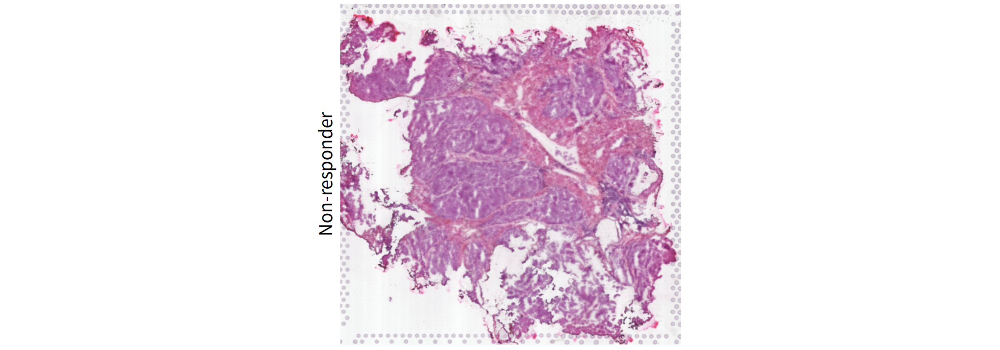

In [48]:
pbc_1 <- SpatialFeaturePlot(spa_p1T, images = "image_P11_T", 
                   features = NULL, alpha = 0) + theme(legend.position = "none") + labs(y = "Non-responder")
pbc_1 <- pbc_1[[1]] 
pbc_tmp <- pbc_1 + theme_bw()
pbc_1$theme$axis.title.y <- pbc_tmp$theme$axis.title.y
pbc_1 <- pbc_1 + theme(axis.title.y = element_text(size = 25))
pbc_1

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


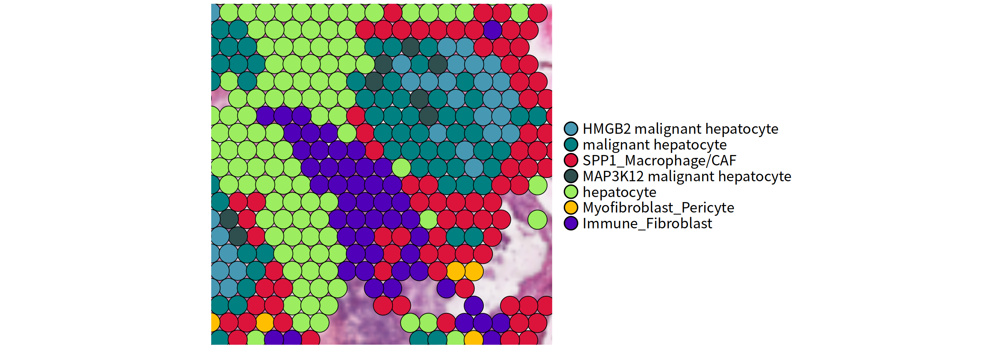

In [54]:
pbc_3 <- SpatialPlot(spa_p1T, images = "image_P11_T", 
                   group.by = "DefineTypes",
            pt.size.factor =6, stroke = 1) + 
  theme(legend.position = "right",
        legend.text = element_text(size = 20),
        legend.key = element_blank(),
        legend.title = element_blank()) + 
  scale_fill_manual(values = pal) + 
  guides(fill = guide_legend(override.aes = list(size = 8)))
pbc_3 <- pbc_3[[1]] + coord_cartesian(xlim = c(380,500), ylim = c(250, 360))
pbc_3

In [59]:
pbc_4 <- SpatialFeaturePlot(spa_p11T, images = "image", 
                   features = NULL, alpha = 0) + theme(legend.position = "none") + labs(y = "Non-responder")
pbc_4 <- pbc_4[[1]] 
pbc_tmp <- pbc_4 + theme_bw()
pbc_4$theme$axis.title.y <- pbc_tmp$theme$axis.title.y
pbc_4 <- pbc_4 + theme(axis.title.y = element_text(size = 25))

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


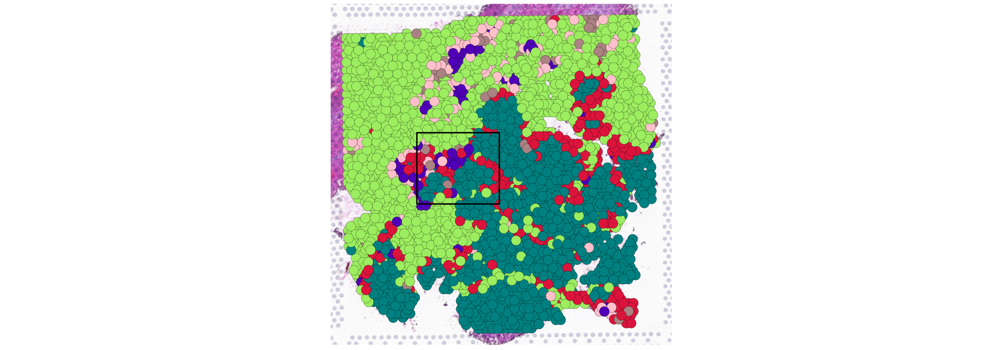

In [60]:
pal2 <- c("#008080FF", "#9CED5FFF", "#DC143CFF",
          "#5000B8FF", "#FFC0CB", "#AA8282")
pbc_5 <- SpatialPlot(spa_p11T, images = "image", 
                   group.by = "DefineTypes",
            pt.size.factor =3) + 
  theme(legend.position = "none") + 
  scale_fill_manual(values = pal2) 
pbc_5 <- pbc_5[[1]]
rect1 <- grid::rectGrob(gp = gpar(fill = NA, col = "black", lwd = 2))
pbc_5 <- pbc_5 + annotation_custom(rect1, 
                       xmin=180,xmax=300,ymin=250,ymax=360
                       )
pbc_5

In [64]:
pbc_6 <- SpatialPlot(spa_p11T, images = "image", 
                   group.by = "DefineTypes",
            pt.size.factor =6, stroke = 1) + 
  theme(legend.position = "right",
        legend.text = element_text(size = 20),
        legend.key = element_blank(),
        legend.title = element_blank()) + 
  scale_fill_manual(values = pal2) + 
  guides(fill = guide_legend(override.aes = list(size = 8)))
pbc_6 <- pbc_6[[1]] + coord_cartesian(xlim = c(180,300), ylim = c(250, 360))

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


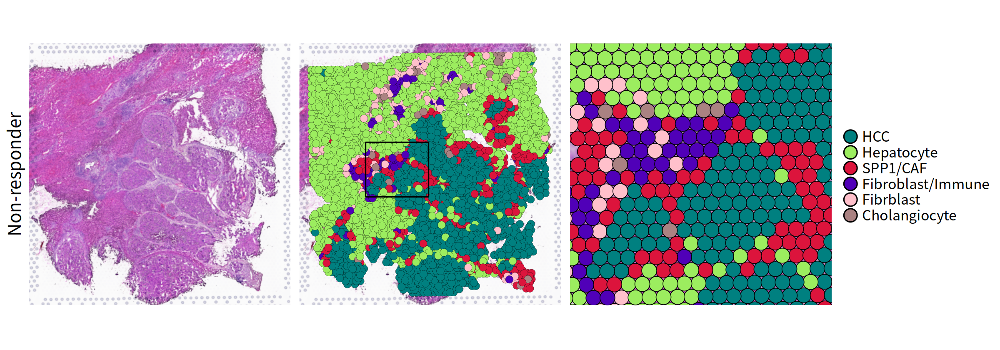

In [66]:
pbc_4 + pbc_5 + pbc_6

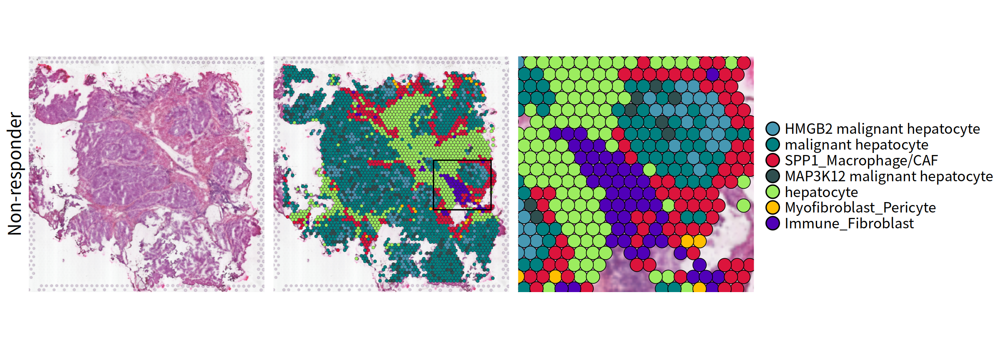

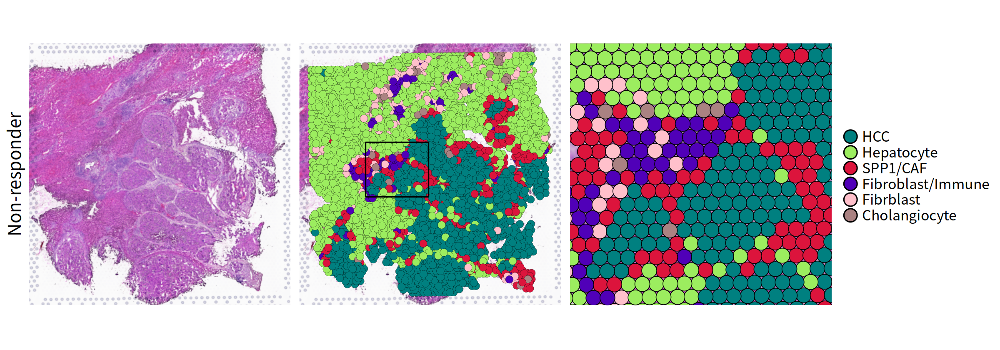

In [75]:
options(repr.plot.width=20)
pbc_cb1 <- pbc_1 + pbc_2 + pbc_3
pbc_cb2 <- pbc_4 + pbc_5 + pbc_6
pbc_cb1
pbc_cb2

## D

In [6]:
# getPalette <- colorRampPalette(brewer.pal(9, "RdYlBu"))
pal_d <- rev(c('#67001f','#b2182b','#d6604d','#f4a582','#fddbc7','#f7f7f7','#d1e5f0','#92c5de','#4393c3','#2166ac','#053061'))
prismatic::color(pal_d)

<colors>
#053061FF #2166ACFF #4393C3FF #92C5DEFF #D1E5F0FF #F7F7F7FF #FDDBC7FF #F4A582FF #D6604DFF #B2182BFF #67001FFF 

Figure D corresponds to B.

In [5]:
fea_d1 = c("AFP","APOA2","HMGB2","MAP3K12","CD68","SPP1","LUM",
          "TIMP1","ADH1B","HP","RGS5","MYH11","PTPRC","CD3D","MS4A1")

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


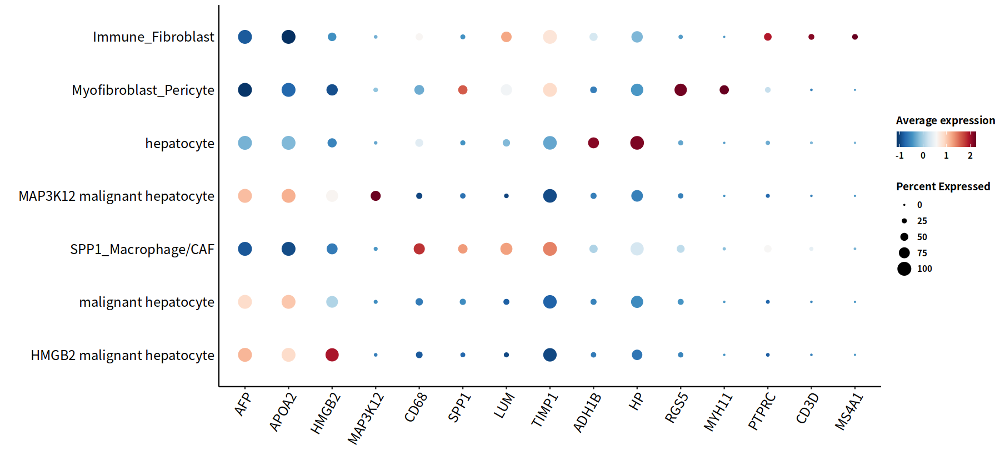

In [7]:
options(repr.plot.width=15)
pd_1 <- DotPlot(object = spa_p1T, features = fea_d1, group.by = 'DefineTypes') + 
                        guides(color = guide_colourbar(direction = "horizontal",
                                   ticks.colour = "white",frame.colour = "white",
                                                 title.position = "top",
                                 order = 1)) +  
  scale_color_gradientn(colours = pal_d,
                        name = "Average expression") + 
  theme_classic() +  
    theme(axis.text.x = element_text(angle = 60,hjust = 1),
          axis.text = element_text(size = 14,color = 'black'),
          strip.text.x = element_blank(),
          axis.ticks.y=element_blank(),
          legend.title = element_text(face = "bold"),
          legend.text = element_text(face = "bold")) + 
  xlab('') + ylab('')
pd_1

In [8]:
fea_d2 = c("CD24","AKR1B10","ALB","HP","DCN","INMT","TIMP1","POSTN",
         "SPP1","TREM2","CD68","CD79A","CD3D","MS4A1","CCL19","CCL21","FXYD2","EPCAM")

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


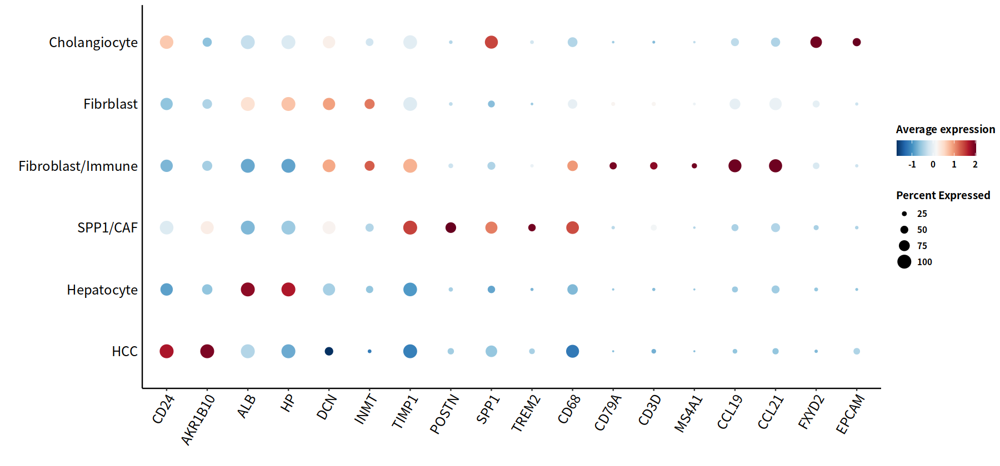

In [10]:
pd_2 <- DotPlot(object = spa_p11T, features = fea_d2, group.by = 'DefineTypes') + 
                        guides(color = guide_colourbar(direction = "horizontal",
                                   ticks.colour = "white",frame.colour = "white",
                                                 title.position = "top",
                                 order = 1)) +  
  scale_color_gradientn(colours = pal_d,
                        name = "Average expression") + 
  theme_classic() +  
    theme(axis.text.x = element_text(angle = 60,hjust = 1),
          axis.text = element_text(size = 14,color = 'black'),
          strip.text.x = element_blank(),
          axis.ticks.y=element_blank(),
          legend.title = element_text(face = "bold"),
          legend.text = element_text(face = "bold")) + 
  xlab('') + ylab('')
pd_2

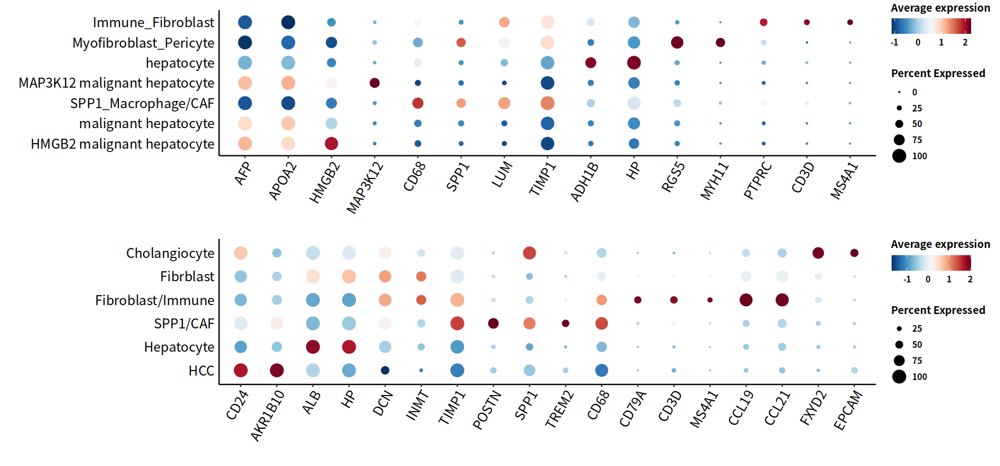

In [12]:
pd <- pd_1/pd_2
pd

## E,F

In [10]:
# Function
plotEF <- function(seu, pal, axis){
    # 1
    pbc_1 <- SpatialFeaturePlot(seu, images = "image", 
                   features = NULL, alpha = 0) + theme(legend.position = "none") + labs(y = "Responder")
    pbc_1 <- pbc_1[[1]] 
    pbc_tmp <- pbc_1 + theme_bw()
    pbc_1$theme$axis.title.y <- pbc_tmp$theme$axis.title.y
    pbc_1 <- pbc_1 + theme(axis.title.y = element_text(size = 25))
    # 2
    # pal2 <- c("#008080FF", "#9CED5FFF", "#DC143CFF",
    #       "#5000B8FF", "#FFC0CB", "#AA8282")
    pbc_2 <- SpatialPlot(seu, images = "image", 
                   group.by = "DefineTypes",
            pt.size.factor =3) + 
  theme(legend.position = "none") + 
  scale_fill_manual(values = pal) 
    pbc_2 <- pbc_2[[1]]
    rect1 <- grid::rectGrob(gp = gpar(fill = NA, col = "black", lwd = 2))
    pbc_2 <- pbc_2 + annotation_custom(rect1, 
                         xmin= axis[1],xmax=axis[2],ymin=axis[3],ymax=axis[4]
                         )
    # 3
    pbc_3 <- SpatialPlot(seu, images = "image", 
                   group.by = "DefineTypes",
            pt.size.factor =6, stroke = 1) + 
  theme(legend.position = "right",
        legend.text = element_text(size = 20),
        legend.key = element_blank(),
        legend.title = element_blank()) + 
  scale_fill_manual(values = pal) + 
  guides(fill = guide_legend(override.aes = list(size = 8)))
    pbc_3 <- pbc_3[[1]] + coord_cartesian(xlim = c(axis[1],axis[2]), ylim = c(axis[3], axis[4]))
    pbc <- pbc_1 + pbc_2 + pbc_3
    return(pbc)
}

In [4]:
spa_p7T$DefineTypes[spa_p7T$DefineTypes %in% c("Malignnat_hepatocyte/Fibroblast", "Malignant_hepatocyte/Myeloid")] <- "Malignant hepatocyte"
spa_p7T$DefineTypes <- factor(spa_p7T$DefineTypes)
pal3 <- c("#FFC0CB", "#008080", "#87CEEB", "#9CED5F",
          "#5000B8", "#007FFF", "#FFBF00", "#DC143C")
axis3 <- c(360, 480, 170, 290)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


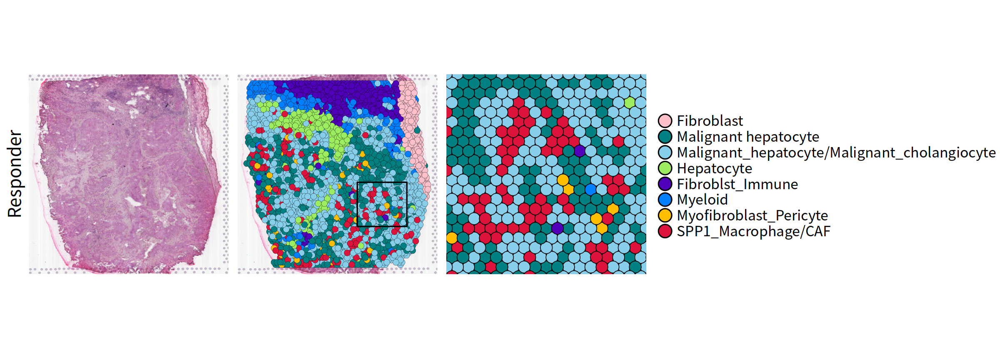

In [9]:
options(repr.plot.width=20)
plotEF(spa_p7T, pal3, axis3)

In [13]:
pal4 <- c("#5000B8", "#008080", "#9CED5F", "#007FFF",
          "#FFC0CB", "#DC143C", "#AA8282")
axis4 <- c(360, 480, 220, 340)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


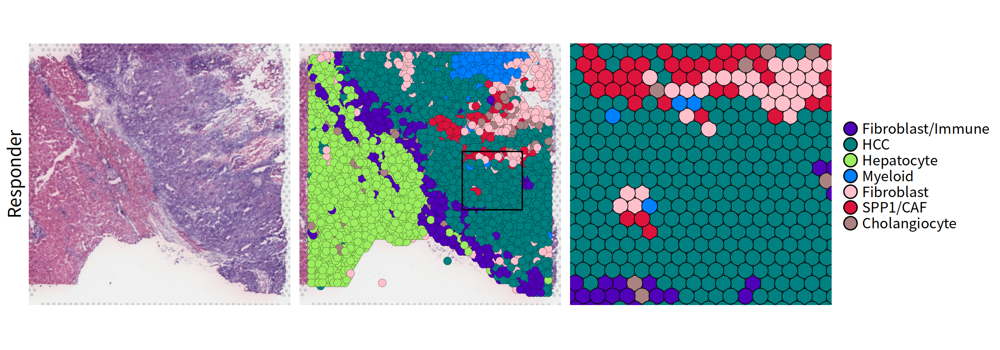

In [14]:
options(repr.plot.width=20)
plotEF(spa_p9T, pal4, axis4)

## G

Figure G corresponds to E.

In [1]:
fea_g1 <- c("SPP1","CD68","MMP9",
         "TIMP1","TAGLN","MYL9",
         "C1QA","CD74",
         "GSTA2","FXYD2","FGB","FGA","APOA2","FABP1","PTPRC","CD3D","CD79A","COL1A1","COL1A2","PLVAP","CLDN5","KRT7","KRT17",
         "MALAT1")

fea_g2 <- c("COL1A1","CD3D","MZB1","C1QA","SPINK1","CD24","HP",
            "ALDOB","S100A8","FTL","ENO1","SPP1","POSTN",
            "CD68","KRT19","FXYD2")


In [11]:
pg_1 <- DotPlot(object = spa_p7T, features = fea_g1, group.by = 'DefineTypes') + 
                        guides(color = guide_colourbar(direction = "horizontal",
                                   ticks.colour = "white",frame.colour = "white",
                                                 title.position = "top",
                                 order = 1)) +  
  scale_color_gradientn(colours = pal_d,
                        name = "Average expression") + 
  theme_classic() +  
    theme(axis.text.x = element_text(angle = 60,hjust = 1),
          axis.text = element_text(size = 14,color = 'black'),
          strip.text.x = element_blank(),
          axis.ticks.y=element_blank(),
          legend.title = element_text(face = "bold"),
          legend.text = element_text(face = "bold")) + 
  xlab('') + ylab('')
pg_2 <- DotPlot(object = spa_p9T, features = fea_g2, group.by = 'DefineTypes') + 
                        guides(color = guide_colourbar(direction = "horizontal",
                                   ticks.colour = "white",frame.colour = "white",
                                                 title.position = "top",
                                 order = 1)) +  
  scale_color_gradientn(colours = pal_d,
                        name = "Average expression") + 
  theme_classic() +  
    theme(axis.text.x = element_text(angle = 60,hjust = 1),
          axis.text = element_text(size = 14,color = 'black'),
          strip.text.x = element_blank(),
          axis.ticks.y=element_blank(),
          legend.title = element_text(face = "bold"),
          legend.text = element_text(face = "bold")) + 
  xlab('') + ylab('')


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


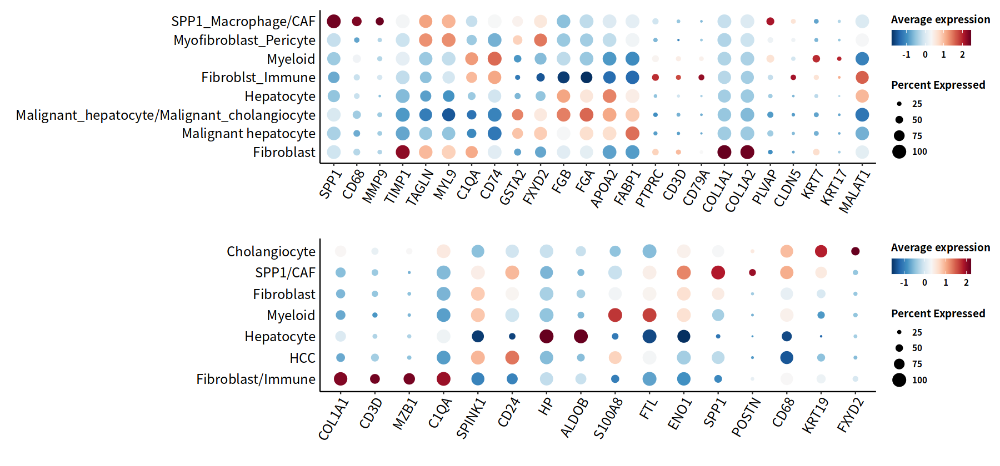

In [12]:
options(repr.plot.width = 15)
pg <- pg_1/pg_2
pg

# Fig1H

## Preprocess

In [2]:
pal_h <- c("Maligiant hepatocytes" = "#008080",
            "HMGB2+malignant hepatocytes" = "#4798b3",
            "MAP3K12+malignant hepatocytes" = "#2f4f4f" , 
            "Malignant cholangiocytes" = "#87ceeb" , 
            "Myeloid cells" = "#007fff" , 
            "SPP1+macrophages/CAFs" = "#dc143c" ,
            "Hepatic stellate cells" = "#fb8072" , 
            "Fibroblast/myeloid cells" = "#f400dc" , 
            "T cells" = "#9e9ac8" , 
            "Hepatocytes" = "#9ced5f" , 
            "Cholangiocytes" = "#aa8282" , 
            "Hepatocytes/myeloid cells" = "#aeae5c" , 
            "Unknown" = "#ffebcd" , 
            "Immune/fibroblast cells" = "#5000b8" , 
            "Fibroblasts" = "#ffc0cb" , 
            "Myofibroblasts/fibroblast cells" = "#ff4500" ,
            "Myofibroblasts/pericytes" = "#ffbf00",
            "ECs" = "#ffd700",
            "Myeloid/fibroblast/endothelial cell" = "#808000") 

In [3]:
file_dir <- 'Input/STData of HCC/'
files <- list.files(file_dir)
files

[1] "P10T_Spatial.rds.gz" "P11T_Spatial.rds.gz" "P1N_Spatial.rds.gz" 
 [4] "P1T_Spatial.rds.gz"  "P2N_Spatial.rds.gz"  "P3T_Spatial.rds.gz" 
 [7] "P5N_Spatial.rds.gz"  "P5T_Spatial.rds.gz"  "P7T_Spatial.rds.gz" 
[10] "P8T_Spatial.rds.gz"  "P9T_Spatial.rds.gz"

In [4]:
sp.list <- lapply(files, function(pro){
  sp <- readRDS(paste0(file_dir, pro))
  sp$DefineTypes <- Idents(sp) 
  sp$orig.ident <- gsub("_Spatial.rds.gz","",pro)
  print(pro)
  return(sp)
})

[1] "P10T_Spatial.rds.gz"
[1] "P11T_Spatial.rds.gz"
[1] "P1N_Spatial.rds.gz"
[1] "P1T_Spatial.rds.gz"
[1] "P2N_Spatial.rds.gz"
[1] "P3T_Spatial.rds.gz"
[1] "P5N_Spatial.rds.gz"
[1] "P5T_Spatial.rds.gz"
[1] "P7T_Spatial.rds.gz"
[1] "P8T_Spatial.rds.gz"
[1] "P9T_Spatial.rds.gz"


In [5]:
file.name <- gsub("_Spatial.rds.gz","",files)
file.name

[1] "P10T" "P11T" "P1N"  "P1T"  "P2N"  "P3T"  "P5N"  "P5T"  "P7T"  "P8T" 
[11] "P9T"

In [6]:
sp.list[[3]]@assays$prediction <- NULL

In [7]:
spa <- merge(sp.list[[1]], y = sp.list[-1],
                 add.cell.ids = file.name)

In [10]:
head(spa@meta.data)

,orig.ident,nCount_Spatial,nFeature_Spatial,DefineTypes,Tissues,Pat_Tissues,Mito.percent,SPP1_Macrophage,CAF
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>
P10T_AAACAAGTATCTCCCA-1,P10T,17580,4927,HCC,NA,NA,NA,NA,NA
P10T_AAACAATCTACTAGCA-1,P10T,19716,5237,HCC,NA,NA,NA,NA,NA
P10T_AAACACCAATAACTGC-1,P10T,13166,3758,Hepatocyte,NA,NA,NA,NA,NA
P10T_AAACAGAGCGACTCCT-1,P10T,12810,4034,HCC,NA,NA,NA,NA,NA
P10T_AAACAGCTTTCAGAAG-1,P10T,19744,4580,Hepatocyte,NA,NA,NA,NA,NA
P10T_AAACAGGGTCTATATT-1,P10T,12252,3570,Hepatocyte,NA,NA,NA,NA,NA


In [11]:
table(spa$orig.ident)


P10T P11T  P1N  P1T  P2N  P3T  P5N  P5T  P7T  P8T  P9T 
4225 4079 1761 3348 3656 2538 4292 3536 4106 3382 4142 

In [12]:
unique(spa$DefineTypes)

[1] "HCC"                                         
 [2] "Hepatocyte"                                  
 [3] "Fibroblast/Immune"                           
 [4] "SPP1/CAF"                                    
 [5] "Fibroblast"                                  
 [6] "Fibrblast"                                   
 [7] "Cholangiocyte"                               
 [8] "Myofibroblast_Endothelial"                   
 [9] "Unknown"                                     
[10] "Fibroblast_Myeloid"                          
[11] "HMGB2 malignant hepatocyte"                  
[12] "malignant hepatocyte"                        
[13] "SPP1_Macrophage/CAF"                         
[14] "MAP3K12 malignant hepatocyte"                
[15] "hepatocyte"                                  
[16] "Myofibroblast_Pericyte"                      
[17] "Immune_Fibroblast"                           
[18] "Hepatocyte_Cholangiocyte"                    
[19] "Myofibroblast_Fibroblast"                    
[20] "Hepatic stella cell"                         
[21] "Malignant hepatocyte"                        
[22] "Hepato_Myeloid"                              
[23] "Myeloid_Fib_Endo"                            
[24] "Myeloid cell"                                
[25] "Malignant_hepatocyte/Myeloid"                
[26] "Malignnat_hepatocyte/Fibroblast"             
[27] "Myeloid"                                     
[28] "Fibroblst_Immune"                            
[29] "Malignant_hepatocyte/Malignant_cholangiocyte"
[30] "Fibroblast/Endothelial/DC"                   
[31] "Fibroblast/Macrophage"                       
[32] "DC/T/B/Plasma"                               
[33] "Fibroblast/DC/T/B/Plasma"                    
[34] "Fibroblast/Macrophage/B/Plasma"              
[35] "cholangiocyte"                               
[36] "Fibroblast/B/Plasma"

In [8]:
label <- names(pal_h)[c(1,10,14,
                6,15,15,
                11,18,13,
                8,2,1,
                6,3,10,
                17,14,4,
                16,7,1,
                12,19,5,
                1,1,5,
                14,1,19,
                14,9,14,
                14,11,14
                )]
names(label) <- unique(spa$DefineTypes)
spa <- RenameIdents(spa, label)
levels(Idents(spa))

[1] "Maligiant hepatocytes"               "Hepatocytes"                        
 [3] "Immune/fibroblast cells"             "SPP1+macrophages/CAFs"              
 [5] "Fibroblasts"                         "Cholangiocytes"                     
 [7] "ECs"                                 "Unknown"                            
 [9] "Fibroblast/myeloid cells"            "HMGB2+malignant hepatocytes"        
[11] "MAP3K12+malignant hepatocytes"       "Myofibroblasts/pericytes"           
[13] "Malignant cholangiocytes"            "Myofibroblasts/fibroblast cells"    
[15] "Hepatic stellate cells"              "Hepatocytes/myeloid cells"          
[17] "Myeloid/fibroblast/endothelial cell" "Myeloid cells"                      
[19] "T cells"

## Calculate freq table

In [11]:
spa_freq_df <- as.data.frame(prop.table(table(Idents(spa), spa$orig.ident), margin = 2))
colnames(spa_freq_df) <- c("Celltype", "Sample", "Freq")
spa_freq_df$Sample <- factor(spa_freq_df$Sample,
                        levels = c("P1N","P2N","P5N","P1T","P3T","P5T",
                        "P8T","P11T","P7T","P9T","P10T"))
head(spa_freq_df)

,Celltype,Sample,Freq
,<fct>,<fct>,<dbl>
1,Maligiant hepatocytes,P10T,0.65230769
2,Hepatocytes,P10T,0.12402367
3,Immune/fibroblast cells,P10T,0.11053254
4,SPP1+macrophages/CAFs,P10T,0.03786982
5,Fibroblasts,P10T,0.07526627
6,Cholangiocytes,P10T,0.00000000


## Plot

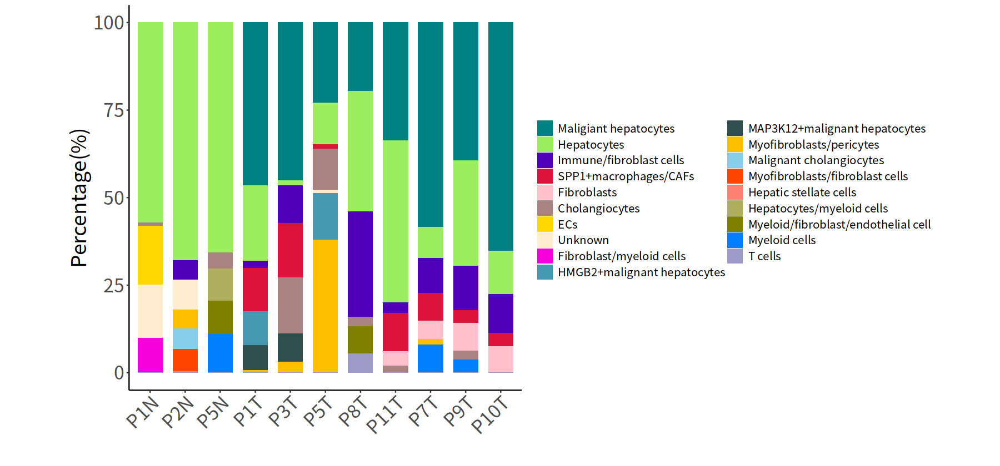

In [12]:
options(repr.plot.width=15)
ph <- ggplot(spa_freq_df) + 
    geom_bar(aes(x = Sample, y = Freq*100, fill = Celltype),stat = "identity",width = 0.7,size = 0.5)+
  labs(x='',y = 'Percentage(%)') +
  coord_fixed(ratio = 0.1) + 
  scale_fill_manual(values = pal_h) + 
    theme_classic() + 
  theme(axis.text = element_text(size=20),
        axis.text.x = element_text(angle = 45,hjust = 1),
        axis.title = element_text(size=22),
        legend.text = element_text(size = 12)) + guides(fill = guide_legend(ncol = 2,title  = NULL))
ph

# Fig1J

In [5]:
pal_h <- c("#eadfdd","#862825")
prismatic::color(pal_h)

<colors>
#EADFDDFF #862825FF 

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


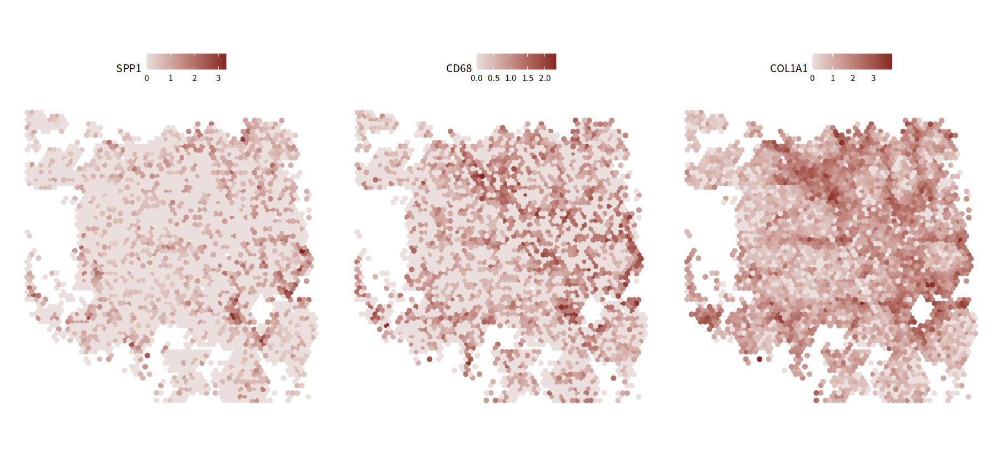

In [7]:
options(repr.plot.width=15)
SpatialFeaturePlot(spa_p1T, images = "image_P11_T",features = c("SPP1","CD68","COL1A1"),
                  ncol=3,
                  image.alpha = 0, stroke = 0, pt.size.factor = 1.7, combine = T) & 
  scale_fill_gradientn(colours = pal_h)

In [8]:
pj_1 <- SpatialFeaturePlot(spa_p1T, images = "image_P11_T",features = c("SPP1","CD68","COL1A1"),
                  ncol=3,
                  image.alpha = 0, stroke = 0, pt.size.factor = 1.7, combine = T) & 
  scale_fill_gradientn(colours = pal_h)
pj_2 <- SpatialFeaturePlot(spa_p7T, images = "image",features = c("SPP1","CD68","COL1A1"),
                  ncol=3,
                  image.alpha = 0, stroke = 0, pt.size.factor = 1.7, combine = T) & 
  scale_fill_gradientn(colours = pal_h)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


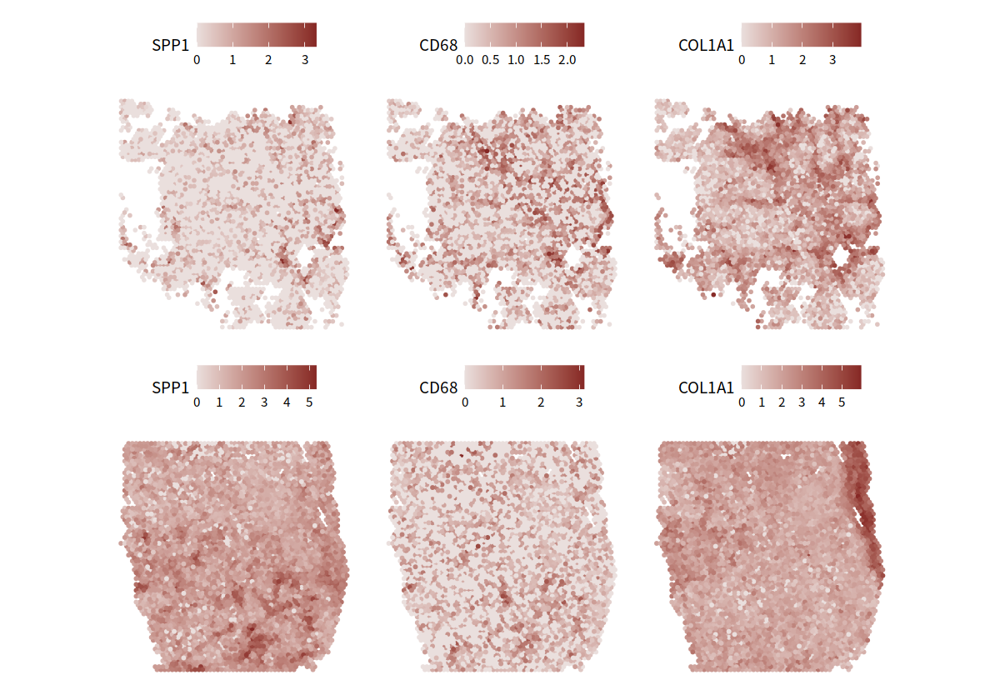

In [10]:
options(repr.plot.width=10)
pj <- pj_1 / pj_2
pj

# Save